In [18]:
cd((@__DIR__) * raw"\..")
include("../table_reader.jl")
include("../utils/Missing_values.jl")

ImputeMissingValues!

In [19]:
series=extract_series("TX_STAID000031.txt",plot=false)
series=truncate_MV(series,"TX")
years=unique(Dates.year.(series.DATE))

include("../utils/Simulation.jl")
Days_list=GatherYearScenario(series[!,2],series.DATE)
avg_day=mean.(Days_list)
max_day=maximum.(Days_list)
df_month = @chain series begin
    @transform(:TEMP = series[!,2]) #Give a common name for TX, TN, etc...
    @transform(:MONTH = month.(:DATE)) #add month column
    @by(:MONTH, :MONTHLY_MEAN = mean(:TEMP), :MONTHLY_STD = std(:TEMP), :MONTHLY_MAX = maximum(:TEMP)) # grouby MONTH + takes the mean/std in each category 
end

#Imputing missing values
# include("utils/Missing_values.jl")
# ImputeMissingValues!(series[!,2],series.DATE)
# N=length(series[!,2])

Row,MONTH,MONTHLY_MEAN,MONTHLY_STD,MONTHLY_MAX
,Int64,Float64,Float64,Float64
1,1,11.7685,3.32309,21.2
2,2,12.8727,3.31852,22.7
3,3,15.4382,3.11683,26.1
4,4,17.9017,3.03244,26.2
5,5,21.9996,3.25811,31.9
6,6,25.4889,3.09155,36.0
7,7,28.5561,3.00014,40.6
8,8,28.0813,2.78482,36.4
9,9,24.7622,2.80431,33.0


## I. Series filtered by removing a trigonometric periodicity

In [20]:
include("../utils/periodicity.jl")
trigo_function=fitted_periodicity_fonc_stepwise(series[!,2],series.DATE)
periodicity=trigo_function.(series.DATE)
x=series[!,2]-periodicity
period=trigo_function.(Date(0):Date(1)-Day(1))

366-element Vector{Float64}:
 11.360177677744044
 11.330789435443284
 11.319531804272328
 11.314118199546195
 11.307013014188461
 11.299705850703678
 11.299624100674373
 11.312066384640858
 11.333030874712806
 11.34849249401394
  ⋮
 11.82307818355045
 11.755025202631867
 11.724356879910092
 11.702286349678266
 11.663355544685697
 11.597909220880783
 11.514651264008029
 11.433073539748904
 11.371147516674833

## Segmenting the dataset by month

In [21]:
include("../utils/Separation.jl")
Monthly_date=MonthlySeparateDates(series.DATE)
Monthly_temp=MonthlySeparateX(x,series.DATE)

12-element Vector{Vector{AbstractVector}}:
 [[1.4398223222559565, 2.6692105645567157, 3.6804681957276717, 0.7858818004538044, 1.6929869858115385, 3.1002941492963227, 2.8003758993256262, -1.3120663846408576, -3.4330308747128058, -0.5484924940139386  …  -5.837422506805396, -6.5453936287718815, -3.315742291746286, -0.5491866990702619, -3.6395977022740276, -1.2809263947987954, 0.5216967657061602, 0.6443174299472503, 0.5462437525919253, 0.7828264140845107], [3.639822322255956, -1.0307894354432836, -1.8195318042723283, -0.11411819954619595, -3.207013014188462, -0.2997058507036776, 2.0003758993256273, 1.1879336153591424, -5.133030874712806, -5.348492494013939  …  2.662577493194604, 4.4546063712281185, 2.984257708253713, -0.6491866990702615, 1.2604022977259728, 0.019073605201203492, 2.02169676570616, 0.6443174299472503, 0.7462437525919245, -1.01717358591549], [2.639822322255956, 4.569210564556716, 4.480468195727672, 5.685881800453805, 5.892986985811538, 2.300294149296322, 2.0003758993256273, 0

## Autocorrelations

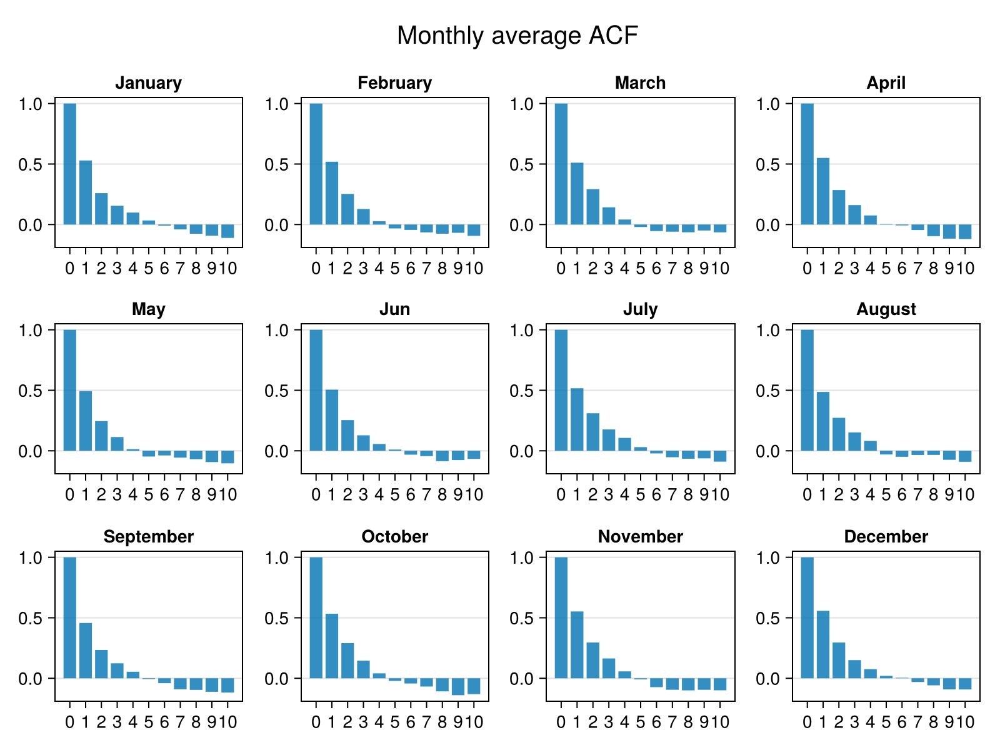

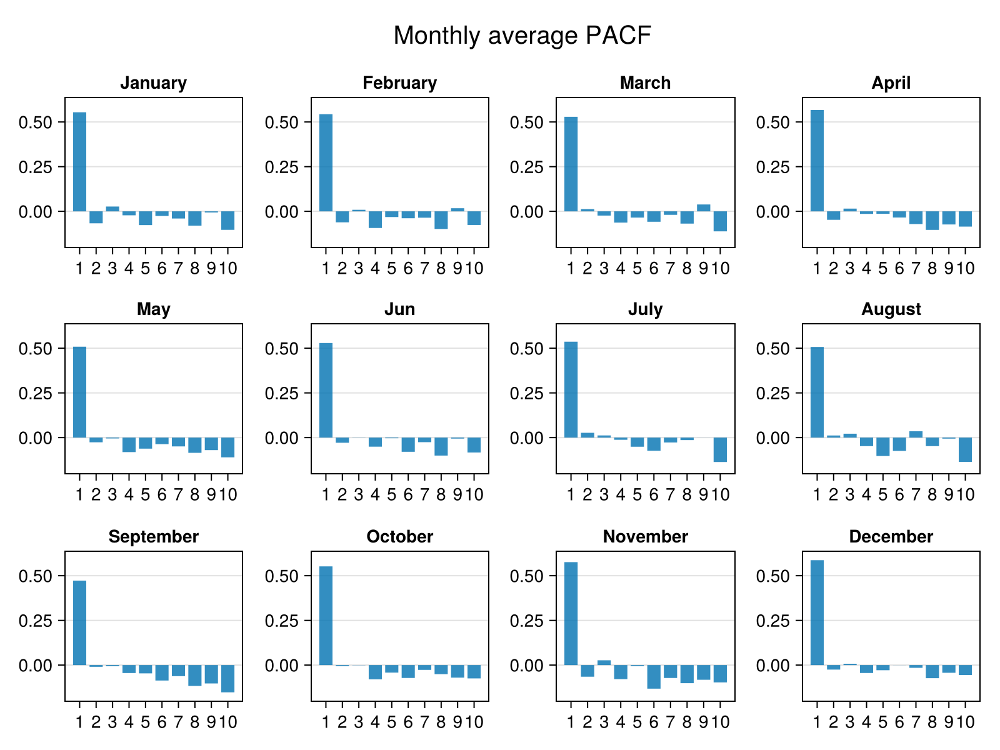

CairoMakie.Screen{IMAGE}


In [22]:
include("../utils/ACF_PACF.jl")
display(MonthlyACF(Monthly_temp))
display(MonthlyPACF(Monthly_temp))

For each month, it still looks like an AR(1) model

# Estimation AR(1)

## Estimation

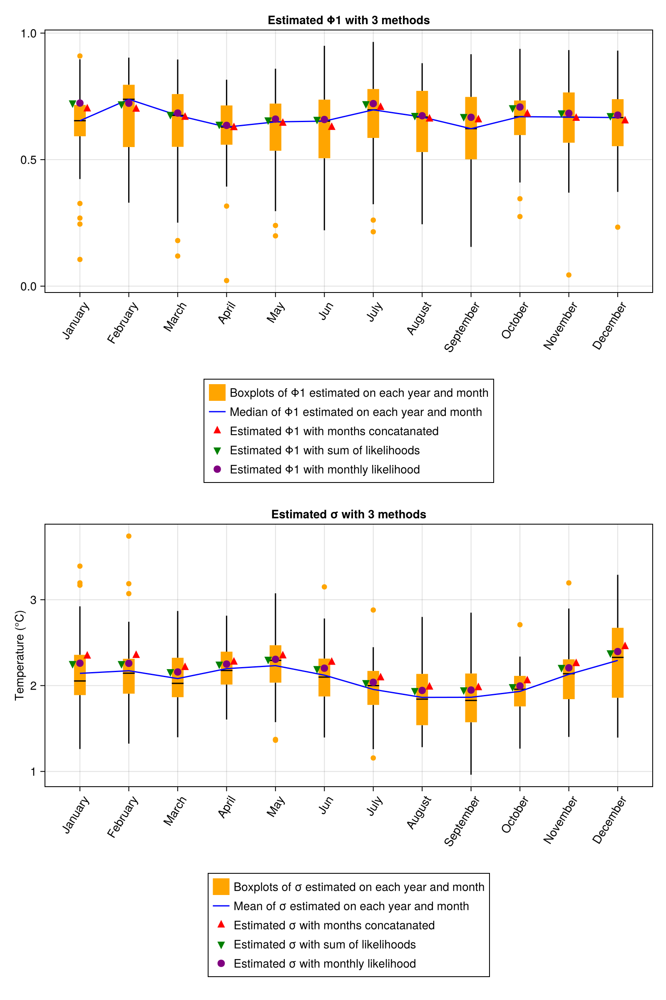

CairoMakie.Screen{IMAGE}


In [23]:
include(raw"..\utils\Estimation.jl")
Params, figure= AllEstimation(x, Date_vec = series.DATE, lineplot=true)
display(figure)

## Simulation

### With monthly likelihoods

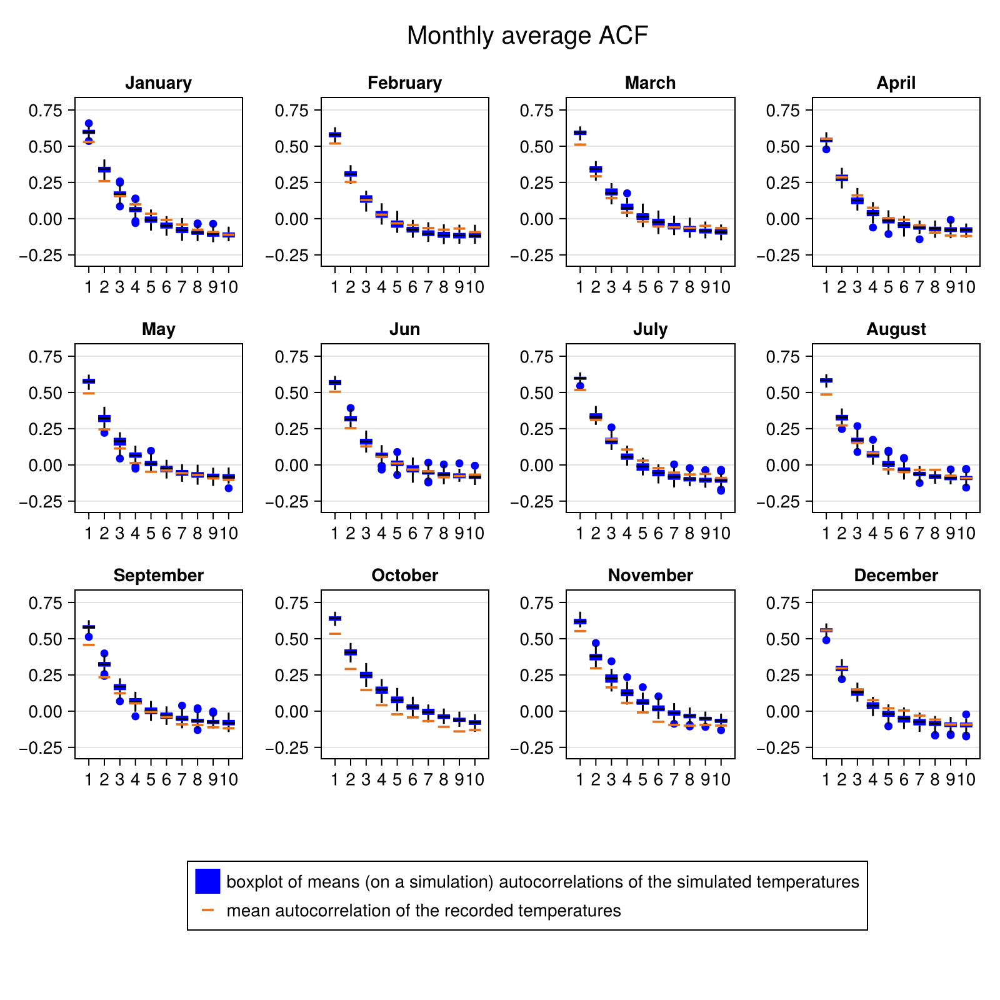

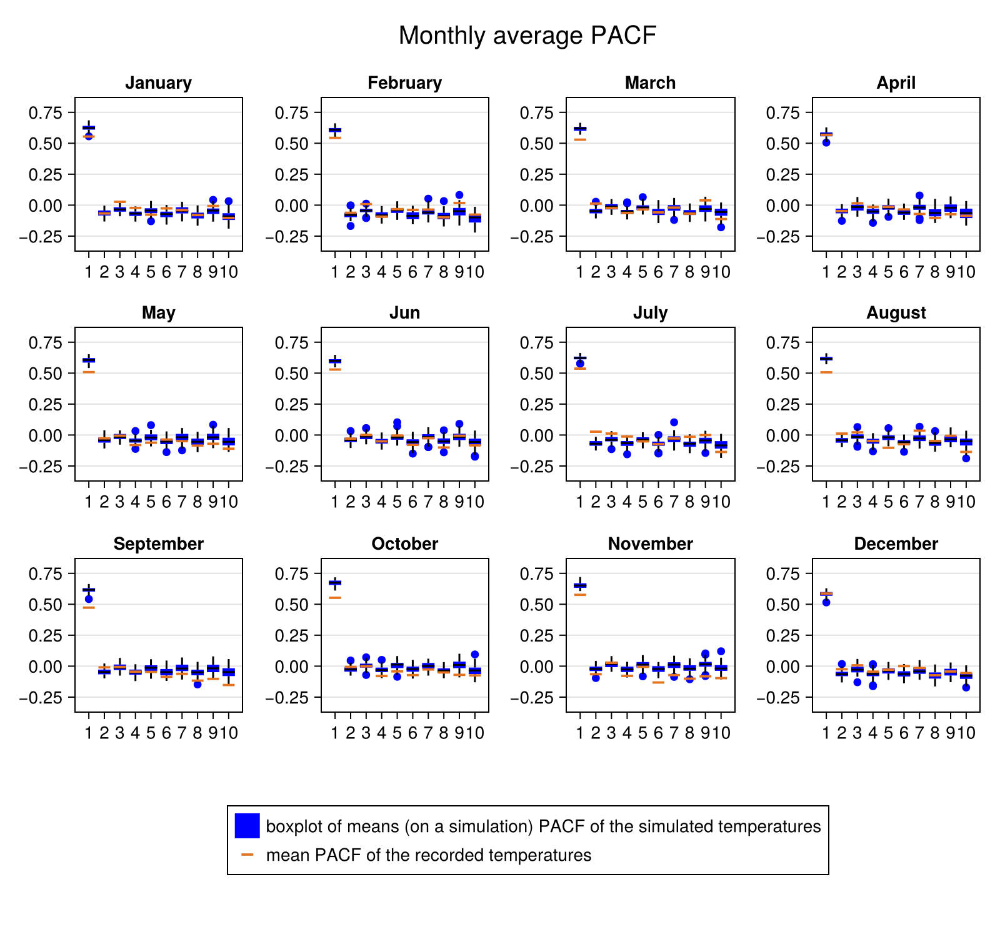

CairoMakie.Screen{IMAGE}


In [25]:
Φ_month_mean,σ_month_mean=TakeParameters(Params,"monthlyLL")
sample_ = SimulateScenarios(Monthly_temp[1][1][1],series.DATE[1]:series.DATE[end],Φ_month_mean,σ_month_mean,period,n=100)
year_sample = GatherYearScenarios(sample_,series.DATE[1]:series.DATE[end])
# display(PlotYearCurves([period,mean.(year_sample)],["Periodicity estimation","Mean simulated temperatures"],"Average daily temperature during a year (centered)"))
# display(PlotYearCurves([period,avg_day,max_day],
# ["Periodicity estimation","Average recorded temperatures","Maximum recorded temperatures","Simulated temperatures range","Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
# "Average daily temperature during a year (centered)",
# [(minimum.(year_sample),maximum.(year_sample)),(quantile.(year_sample,0.25),quantile.(year_sample,0.75))],
# [("#009bff",0.2),("#009bff",0.5)],
# colors=["blue","orange","red"]
# ))
# display(PlotYearCurves([maximum.(year_sample) .- minimum.(year_sample) , quantile.(year_sample,0.75) .- quantile.(year_sample,0.25)],
# ["Simulated temperatures range" ,"Simulated temperatures interquartile range, p ∈ [0.25,0.75]"],
# "Simulated temperatures interquartile range"
# ))
# display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))
display(Plot_Sample_MonthlyACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp))
display(Plot_Sample_MonthlyPACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp))

In [26]:
mean(Error_MonthlyACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp))

0.045542987492645653

In [27]:
MPACF=Error_MonthlyPACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp)
display(mean(MPACF[1,:]))
display(mean(MPACF[2,:]))

0.042464381456505856

0.04255068847780874

# Estimation AR(2)

## Estimation

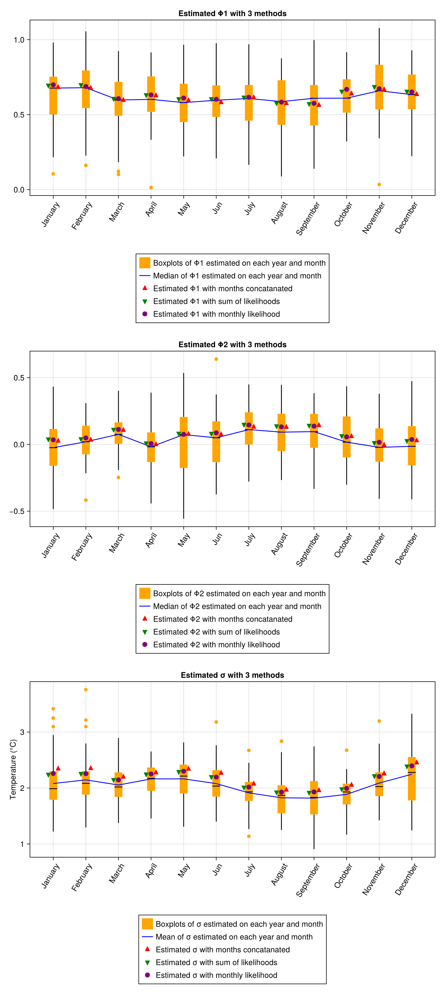

CairoMakie.Screen{IMAGE}


In [28]:
include("../utils/Estimation.jl")
Params, figure= AllEstimation(x, 2, Date_vec=series.DATE, lineplot=true)
display(figure)

In [29]:
params2 = TakeParameters(Params,"monthlyLL")

([[0.6988314066032247, 0.03423564544111582], [0.6875748353205128, 0.04844663006730003], [0.6066237091778832, 0.11213618478608246], [0.6313468672011971, 0.006264583242662397], [0.610480442720738, 0.07540119574475065], [0.6021529806095638, 0.08670948938012182], [0.616023250587015, 0.14539654727393048], [0.5836370765841998, 0.13158232180694543], [0.5753299415276872, 0.1369917973905635], [0.6684332838537962, 0.05669089817835465], [0.6722416837531394, 0.015995907631628573], [0.6511565421975531, 0.036994980935022063]], [2.259295483619778, 2.2565575368741477, 2.145338684342195, 2.250436956095881, 2.2995591111885614, 2.194600161142976, 2.016638462302703, 1.9263628671845636, 1.9299619393423424, 1.9927638590412253, 2.206652132116338, 2.3948661160373934])

In [ ]:
include(raw"..\utils\Structure.jl")
model_ = fit_AR(series[:, 2], series.DATE;
    p=1,
    periodicity_model="autotrigo",
    Trendtype="null",
    σ_periodicity_model="null",
    σ_Trendtype="null")

display(model_.Φ)
display(model_.σ)
model_.nspart == period

12-element RowSlices{Matrix{Float64}, Tuple{Base.OneTo{Int64}}, SubArray{Float64, 1, Matrix{Float64}, Tuple{Int64, Base.Slice{Base.OneTo{Int64}}}, true}}:
 [0.7234661133895876]
 [0.7228649987342464]
 [0.684119148403695]
 [0.63536546193143]
 [0.660139866701661]
 [0.658597813612027]
 [0.7214134460719479]
 [0.673375460903296]
 [0.6673143441932131]
 [0.7078662627062364]
 [0.6831309376768098]
 [0.6759638422839827]

12-element Vector{Float64}:
 2.2606178517545077
 2.2592357089413904
 2.1584718849662847
 2.250481190001408
 2.3061180875205265
 2.202768479835353
 2.0385367219819788
 1.943492478856043
 1.9482725704218082
 1.995995806355808
 2.206926808339162
 2.39651072402734

ErrorException: type MonthlyAR has no field nspart

In [49]:
Φ_month_mean,σ_month_mean

([[0.6988314066032247, 0.03423564544111582], [0.6875748353205128, 0.04844663006730003], [0.6066237091778832, 0.11213618478608246], [0.6313468672011971, 0.006264583242662397], [0.610480442720738, 0.07540119574475065], [0.6021529806095638, 0.08670948938012182], [0.616023250587015, 0.14539654727393048], [0.5836370765841998, 0.13158232180694543], [0.5753299415276872, 0.1369917973905635], [0.6684332838537962, 0.05669089817835465], [0.6722416837531394, 0.015995907631628573], [0.6511565421975531, 0.036994980935022063]], [2.259295483619778, 2.2565575368741477, 2.145338684342195, 2.250436956095881, 2.2995591111885614, 2.194600161142976, 2.016638462302703, 1.9263628671845636, 1.9299619393423424, 1.9927638590412253, 2.206652132116338, 2.3948661160373934])

### Estimation and simulation with monthly likelihoods

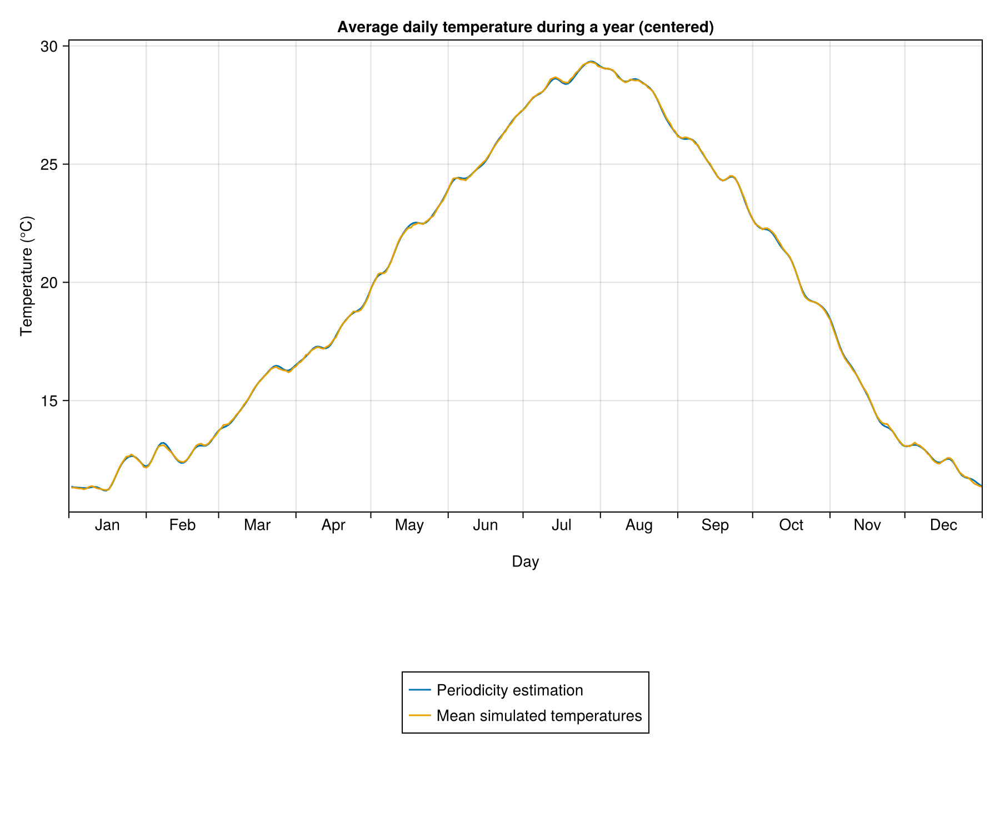

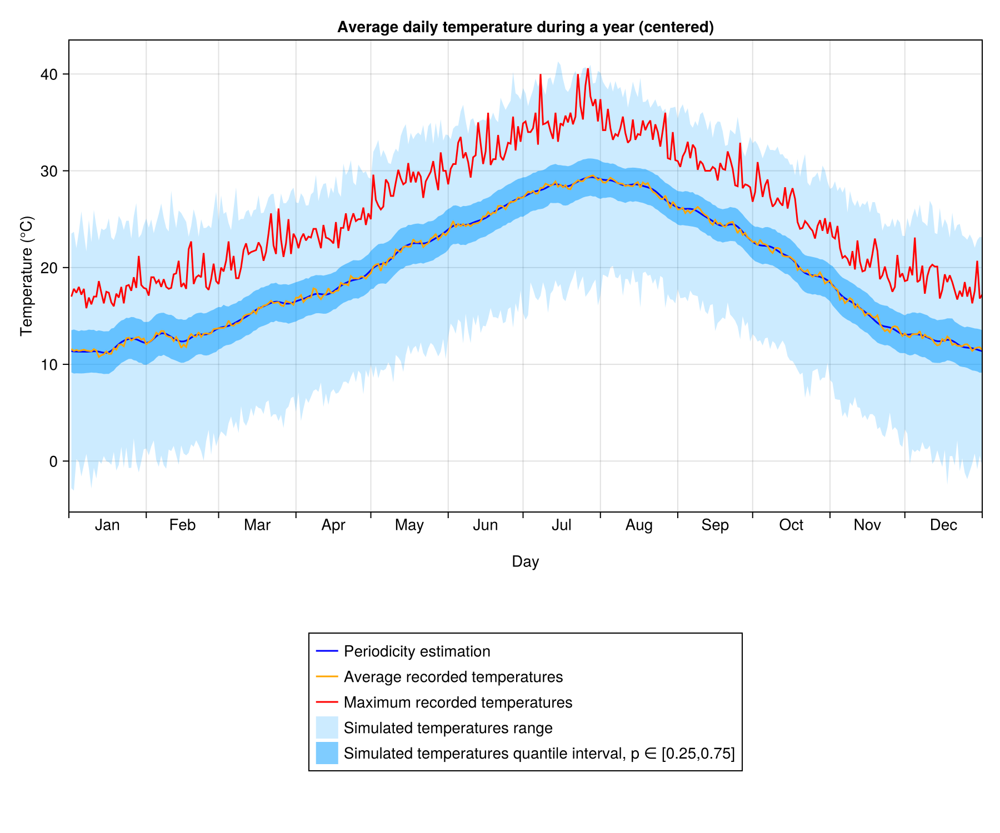

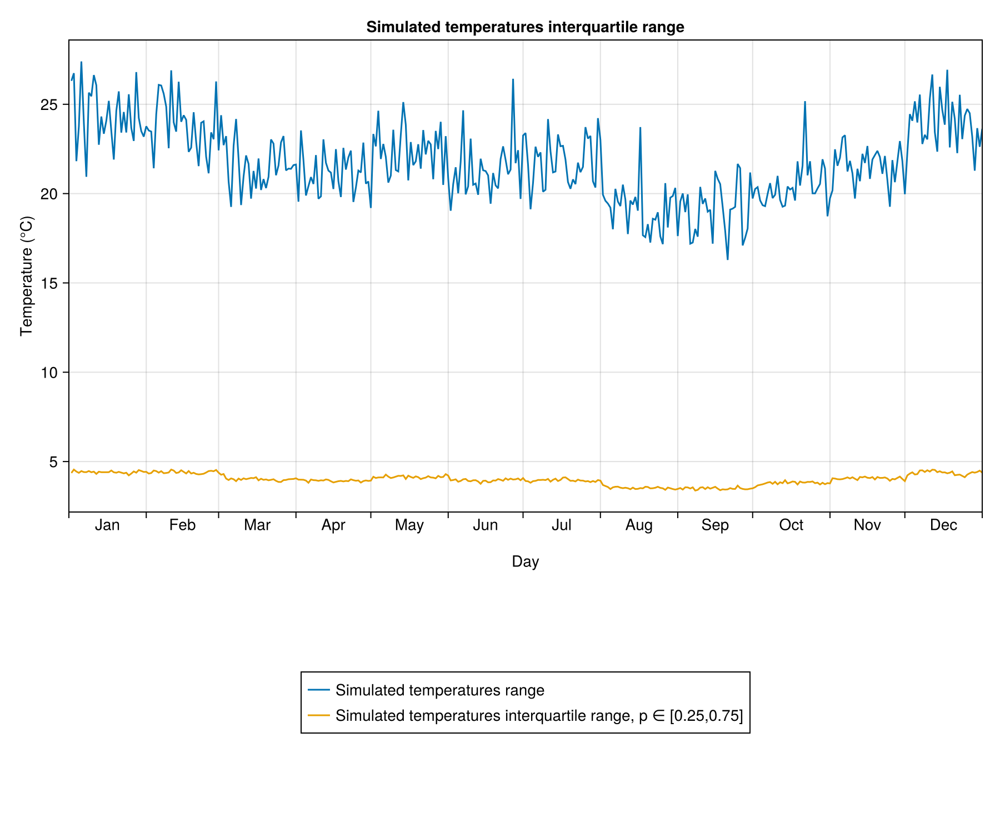

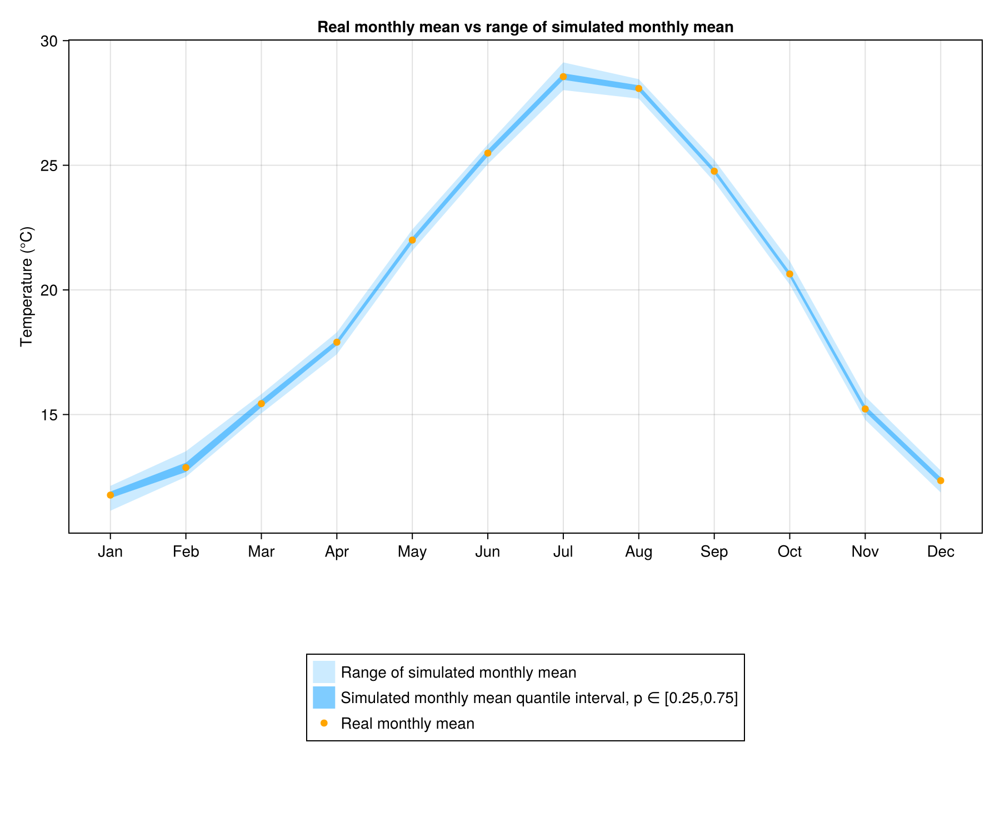

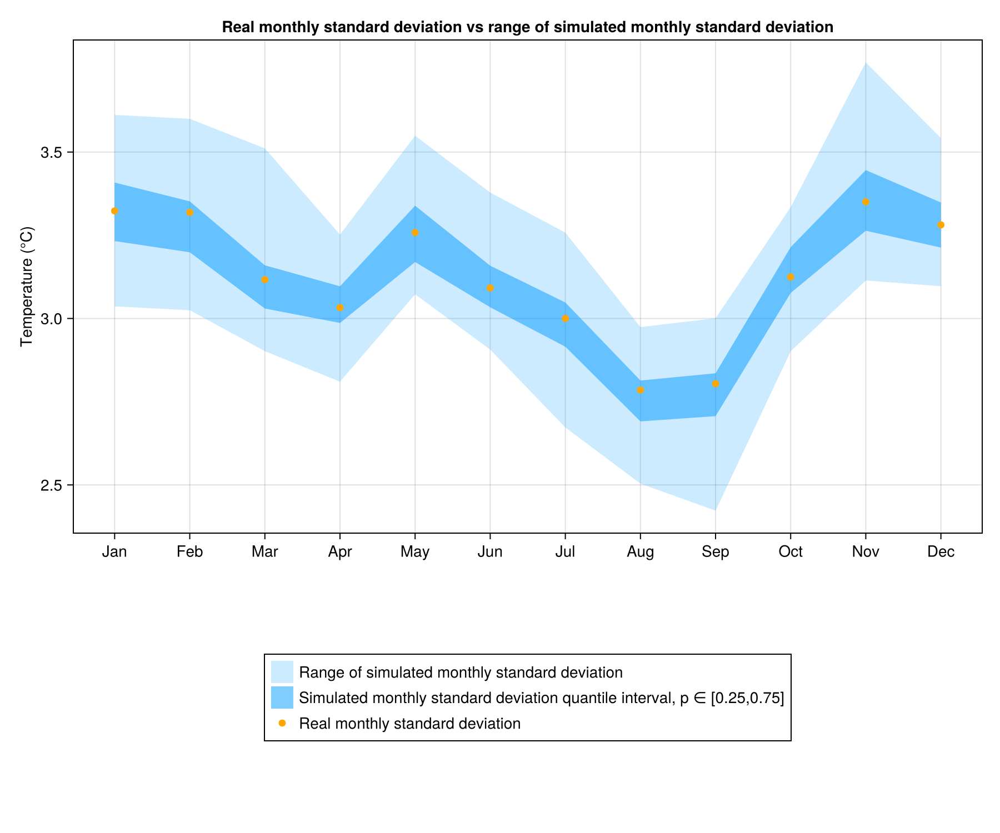

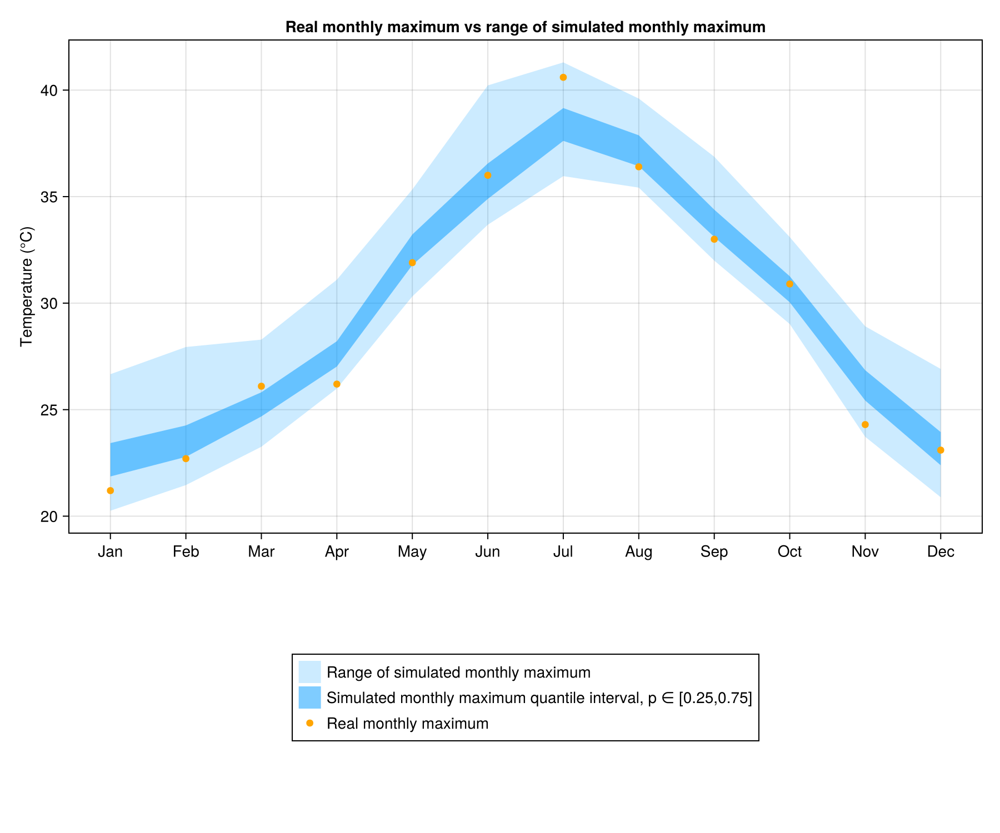

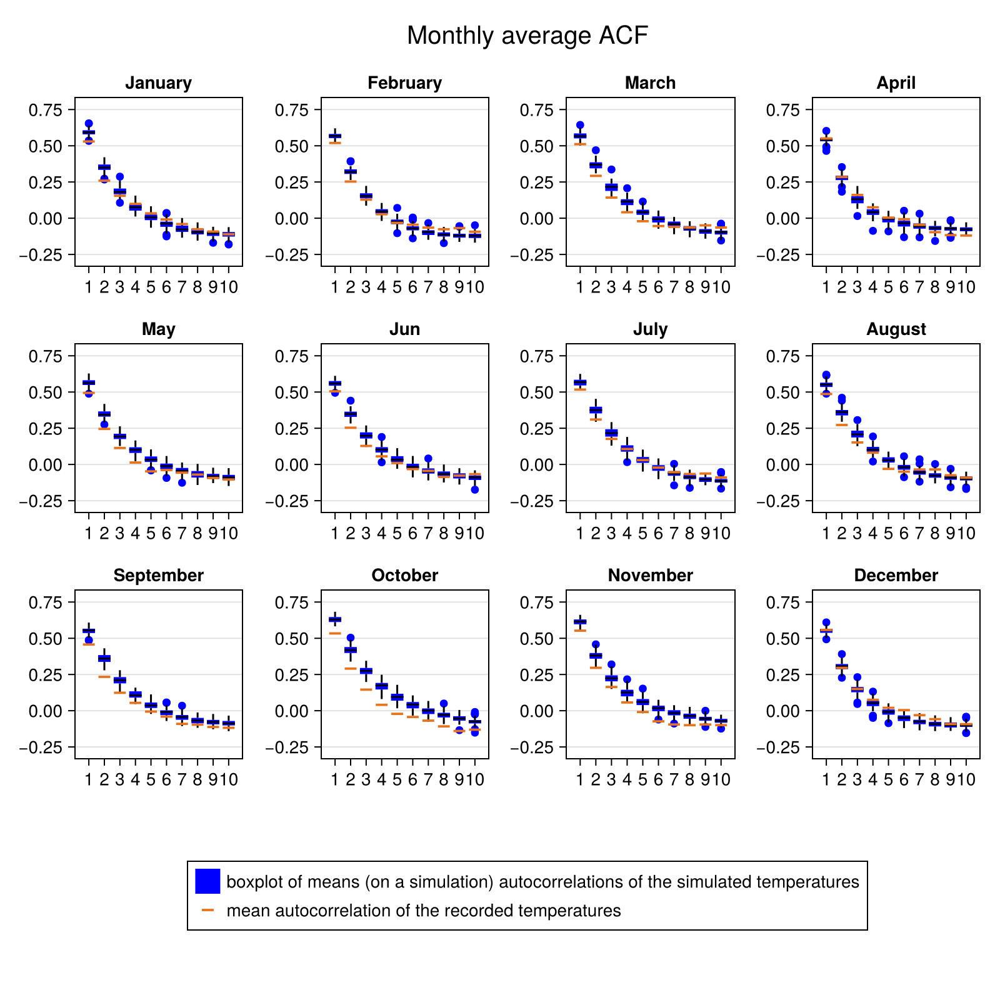

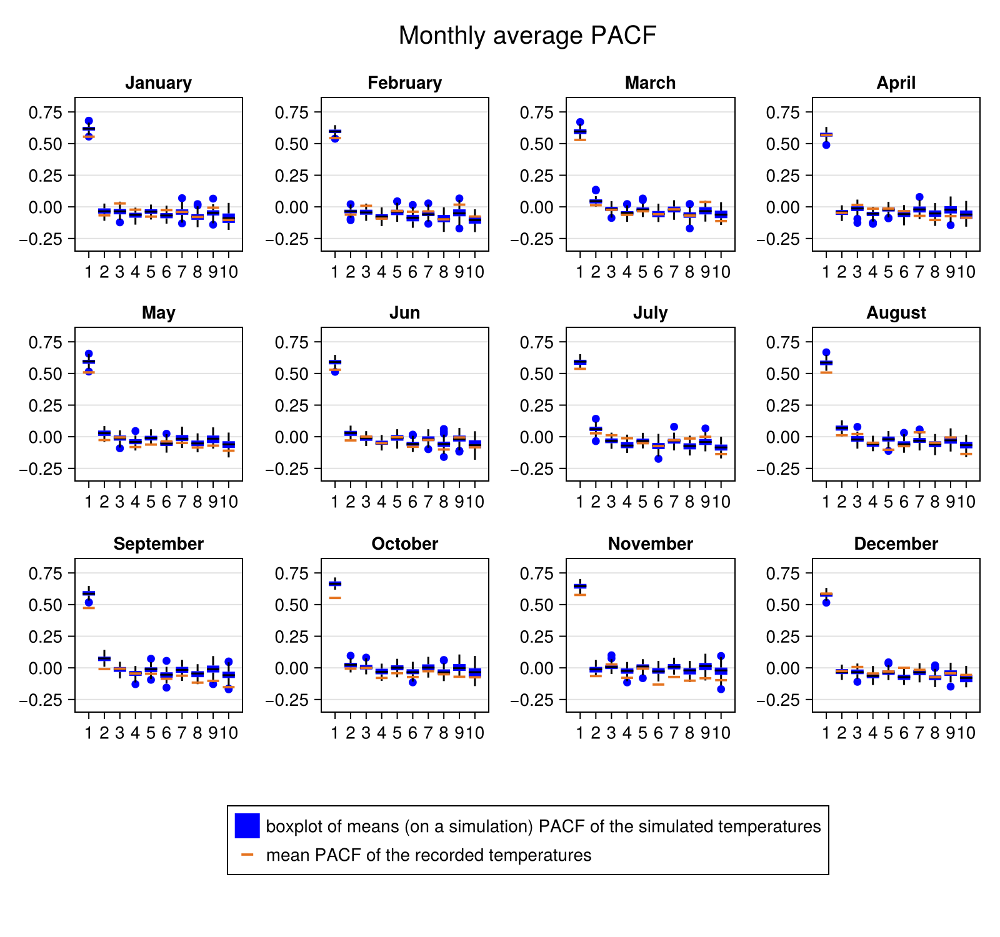

CairoMakie.Screen{IMAGE}


In [50]:
Φ_month_mean,σ_month_mean=TakeParameters(Params,"monthlyLL")
sample_ = SimulateScenarios(Monthly_temp[1][1][1:2],series.DATE[1]:series.DATE[end],Φ_month_mean,σ_month_mean,period,n=100)
year_sample = GatherYearScenarios(sample_,series.DATE[1]:series.DATE[end])
display(PlotYearCurves([period,mean.(year_sample)],["Periodicity estimation","Mean simulated temperatures"],"Average daily temperature during a year (centered)"))
display(PlotYearCurves([period,avg_day,max_day],
["Periodicity estimation","Average recorded temperatures","Maximum recorded temperatures","Simulated temperatures range","Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
"Average daily temperature during a year (centered)",
[(minimum.(year_sample),maximum.(year_sample)),(quantile.(year_sample,0.25),quantile.(year_sample,0.75))],
[("#009bff",0.2),("#009bff",0.5)],
colors=["blue","orange","red"]
))
display(PlotYearCurves([maximum.(year_sample) .- minimum.(year_sample) , quantile.(year_sample,0.75) .- quantile.(year_sample,0.25)],
["Simulated temperatures range" ,"Simulated temperatures interquartile range, p ∈ [0.25,0.75]"],
"Simulated temperatures interquartile range"
))
display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))
display(Plot_Sample_MonthlyACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp))
display(Plot_Sample_MonthlyPACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp))

In [51]:
mean(Error_MonthlyACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp))

0.048931889867995536

In [52]:
MPACF=Error_MonthlyPACF(sample_,series.DATE[1]:series.DATE[end],Monthly_temp)
display(mean(MPACF[1,:]))
display(mean(MPACF[2,:]))

0.04338248621917385

0.041632957810576285

L'AR1 semble légérement mieux que l'AR2 car les différences d'ACF avec les données réels sont légérement plus faible. Mais les différences entre les deux possibilités sont assez faibles.

# Test to see if Rand() works to simulate scenarios 

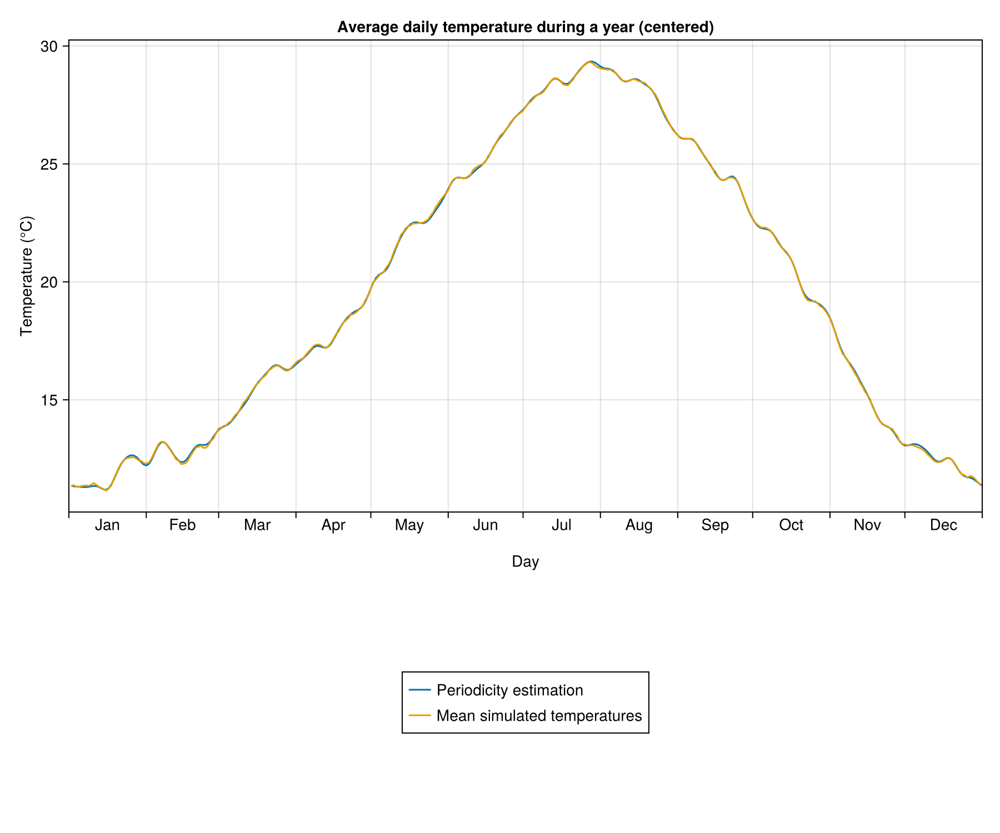

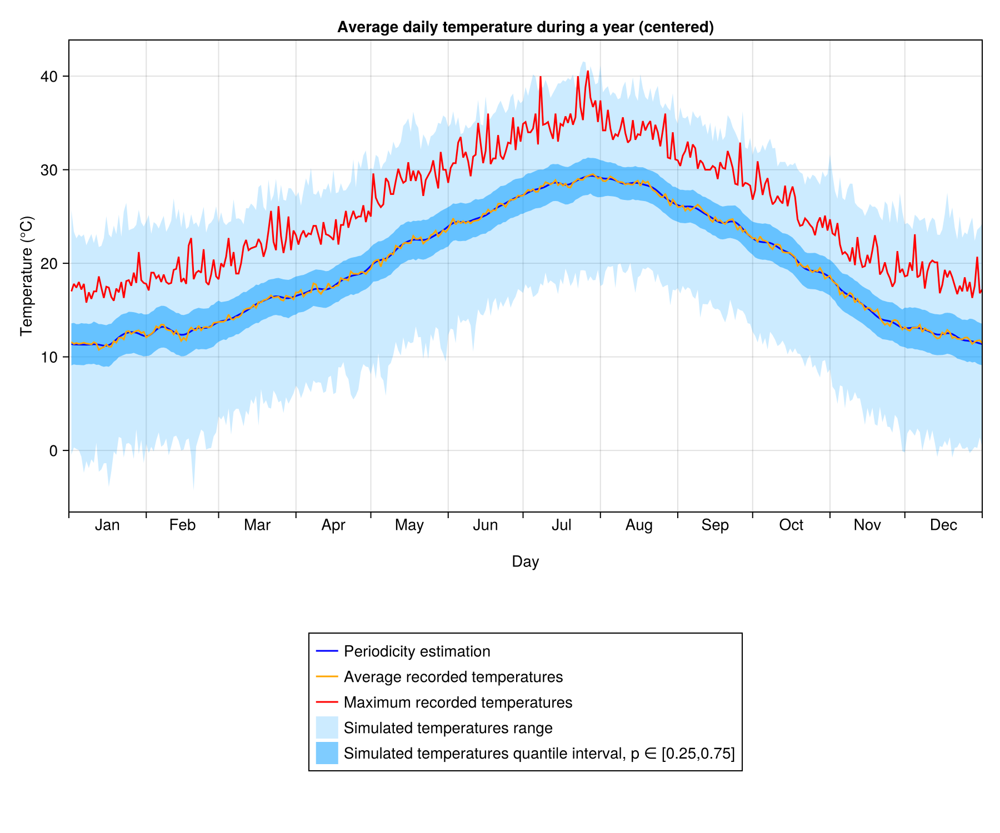

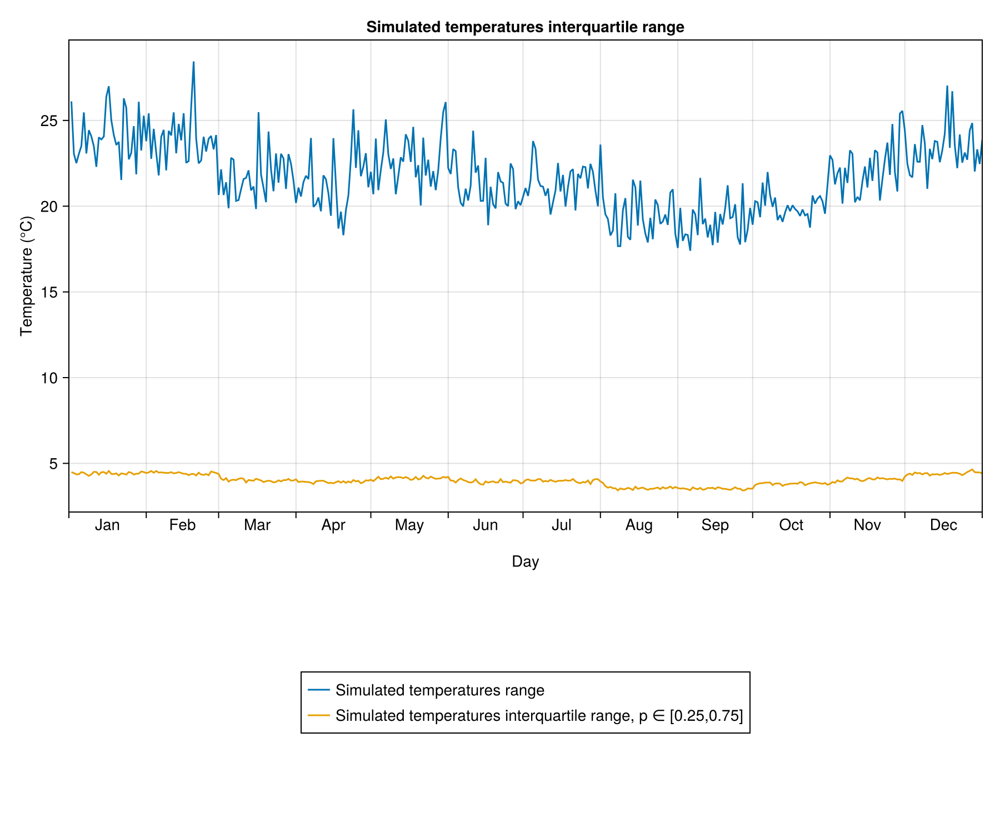

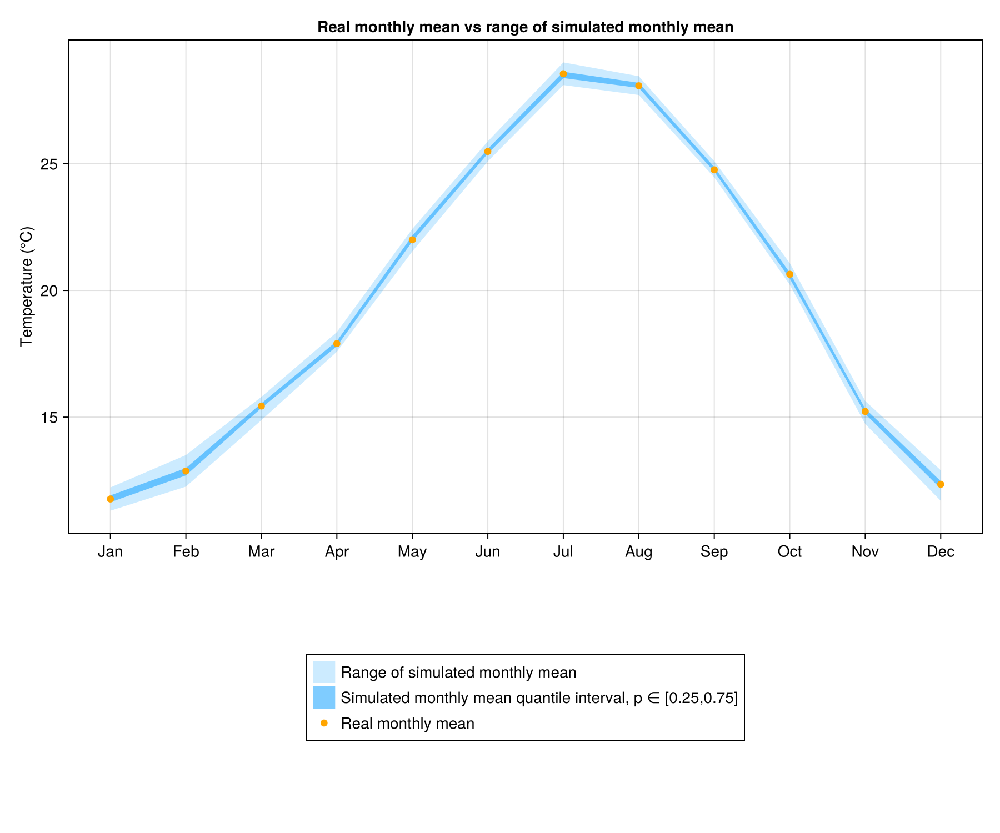

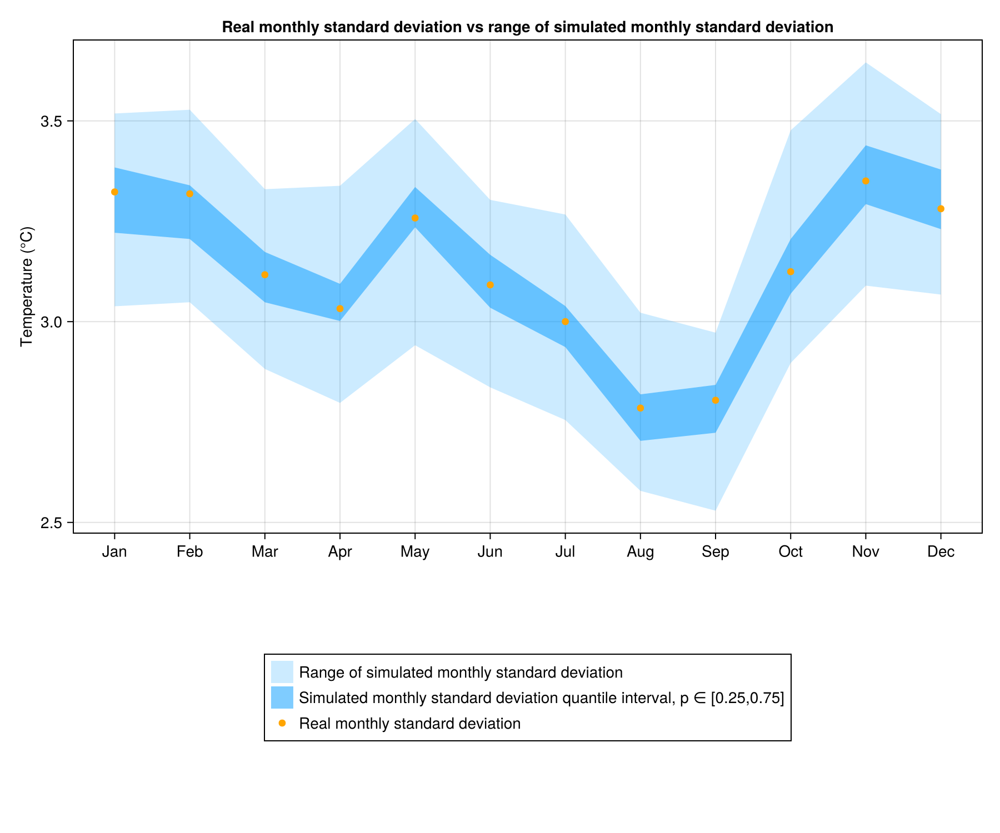

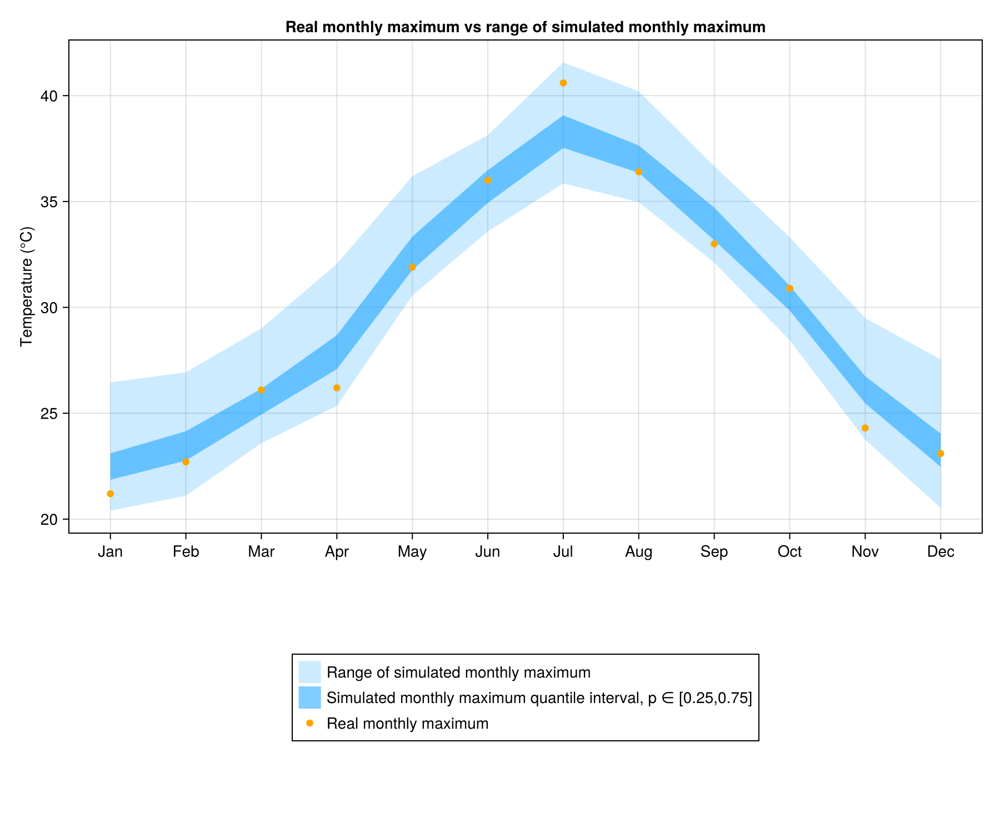

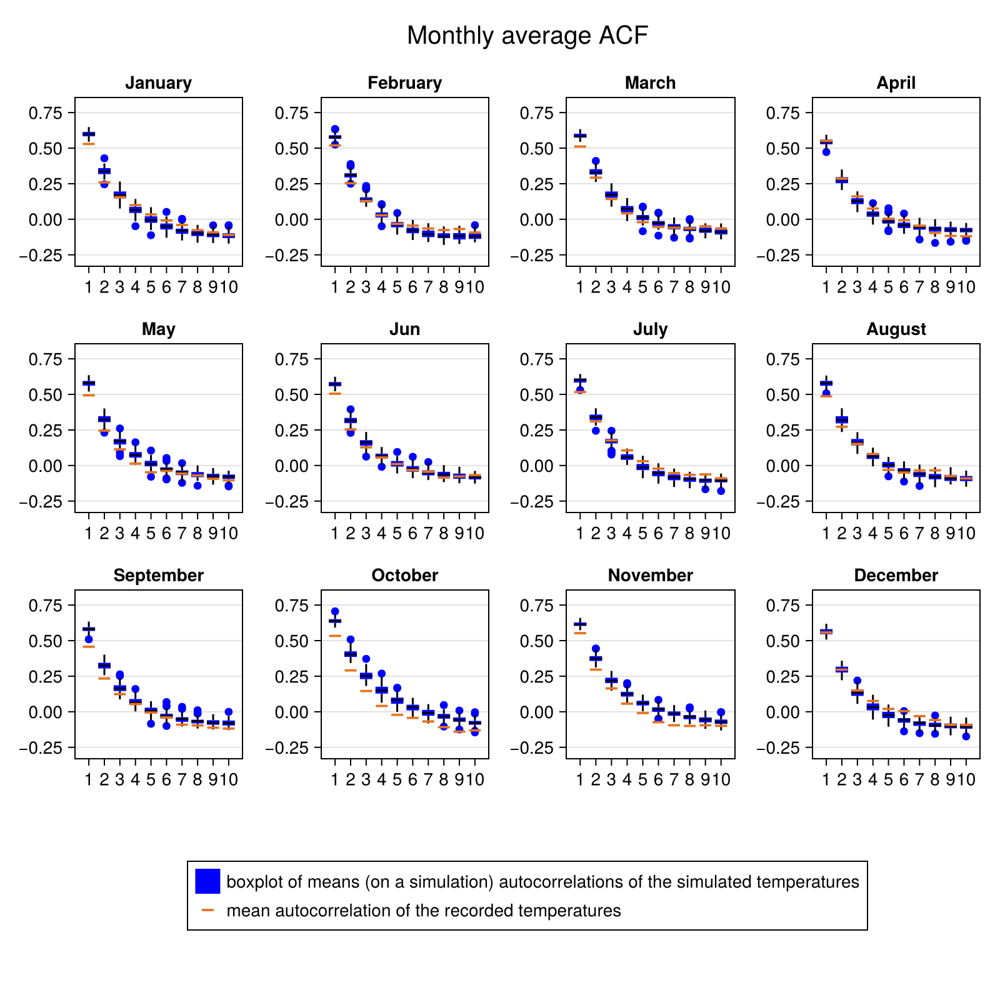

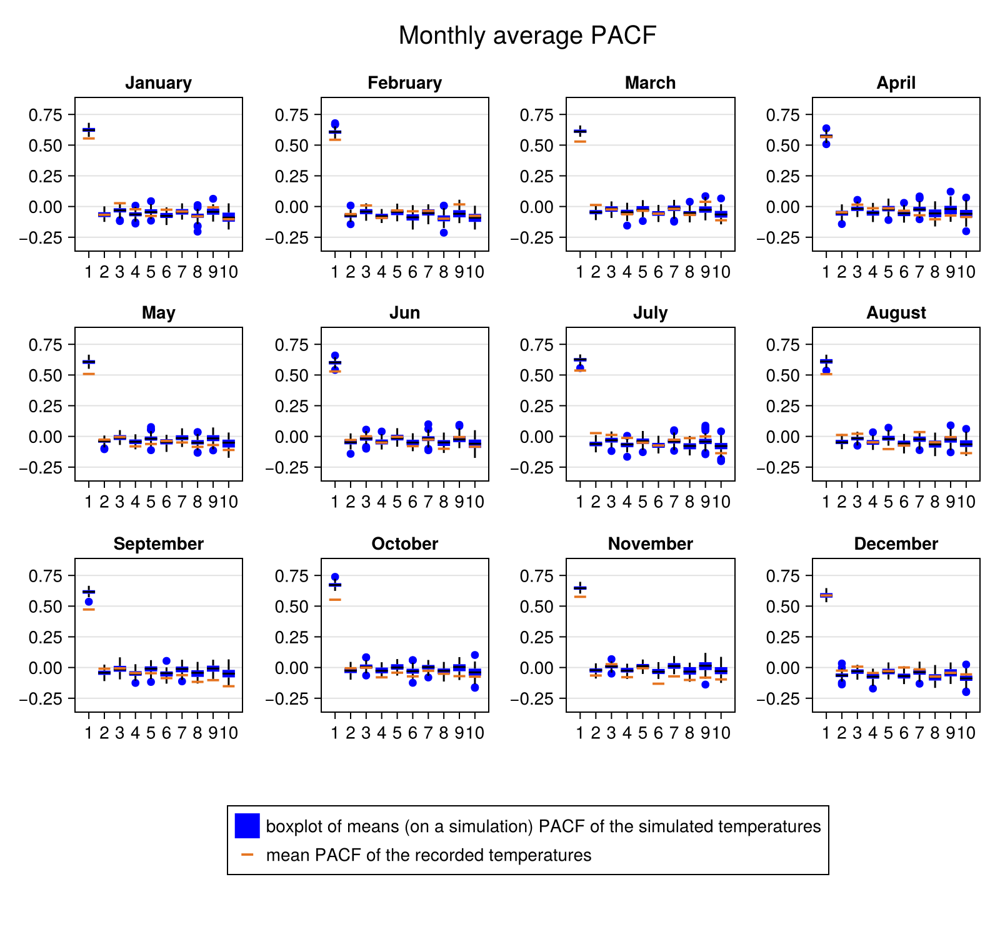

CairoMakie.Screen{IMAGE}


In [53]:
sample_ = rand(model_, 100, series.DATE[1]:series.DATE[end])
year_sample = GatherYearScenarios(sample_, series.DATE[1]:series.DATE[end])
display(PlotYearCurves([period, mean.(year_sample)], ["Periodicity estimation", "Mean simulated temperatures"], "Average daily temperature during a year (centered)"))
display(PlotYearCurves([period, avg_day, max_day],
    ["Periodicity estimation", "Average recorded temperatures", "Maximum recorded temperatures", "Simulated temperatures range", "Simulated temperatures quantile interval, p ∈ [0.25,0.75]"],
    "Average daily temperature during a year (centered)",
    [(minimum.(year_sample), maximum.(year_sample)), (quantile.(year_sample, 0.25), quantile.(year_sample, 0.75))],
    [("#009bff", 0.2), ("#009bff", 0.5)],
    colors=["blue", "orange", "red"]
))
display(PlotYearCurves([maximum.(year_sample) .- minimum.(year_sample), quantile.(year_sample, 0.75) .- quantile.(year_sample, 0.25)],
    ["Simulated temperatures range", "Simulated temperatures interquartile range, p ∈ [0.25,0.75]"],
    "Simulated temperatures interquartile range"
))
display.(WrapPlotMonthlyStats(df_month, sample_, series.DATE[1]:series.DATE[end]))
display(Plot_Sample_MonthlyACF(sample_, series.DATE[1]:series.DATE[end], Monthly_temp))
display(Plot_Sample_MonthlyPACF(sample_, series.DATE[1]:series.DATE[end], Monthly_temp))